# EDA

## Real Estate Consultancy

![](https://media4.giphy.com/media/v1.Y2lkPTc5MGI3NjExZ2RhZWxvNWRua20xemRucGFiZTJzajR6Mno3dW0wbjNzMXA3eGVtYyZlcD12MV9pbnRlcm5hbF9naWZfYnlfaWQmY3Q9Zw/3orif5inix8PBbiJBm/giphy.webp)

### Assignment: 
The year is 2015. It is Spring and there is a lot of dirty money from last Winter to wash clean of yellow snow. This is an exploratory data analysis meant to back the real estate consultancy we are about to give to our client. Let's help them do their laundry without alarming the nosy neighbors. 

## Client "Amy Williams" (Mafiosi/Seller)

Our client needs to sell central top 10% houses to make "clean" money, and needs to keep the average houses in the outskirts to use them as safe houses when needed.

#### Hypothesis 1:  
It might draw too much attention selling the fancy central objects now.
* sales trend in past months, are this month's sales significantly lower than usual?

#### Hypothesis 2:  
It might draw too much attention selling the fancy central objects in certain seasons (e.g. winter) of the year
* The number of sales is significantly higher for 1 or more specific seasons?

#### Hypothesis 3: 
It might draw too much attention selling coastline objects where the client might have used the water as an alternative recycling method for biodegradable "waste"
* overall sales trend of waterfront objects in the past years - the newer the date, the less sales?

#### Hypothesis 4: 
It might draw attention to sell fancy central houses and NOT sell the average ones in the outskirts
* Sales of average houses in the outskirts are higher than those of top 10% quality houses in city center?

In [1]:
import warnings

warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from matplotlib.ticker import PercentFormatter
plt.rcParams.update({ "figure.figsize" : (8, 5),"axes.facecolor" : "white", "axes.edgecolor":  "black"})
plt.rcParams["figure.facecolor"]= "w"
pd.plotting.register_matplotlib_converters()
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [2]:
df_import = pd.read_csv('data/eda.csv')
df_import.head(10)

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price
0,7129300520,3.000,1.000,1180.000,5650.000,1.000,NaN,0.000,3,7,...,0.000,1955,0.000,98178,47.511,-122.257,1340.000,5650.000,2014-10-13,221900.000
1,6414100192,3.000,2.250,2570.000,7242.000,2.000,0.000,0.000,3,7,...,400.000,1951,19910.000,98125,47.721,-122.319,1690.000,7639.000,2014-12-09,538000.000
2,5631500400,2.000,1.000,770.000,10000.000,1.000,0.000,0.000,3,6,...,0.000,1933,NaN,98028,47.738,-122.233,2720.000,8062.000,2015-02-25,180000.000
3,2487200875,4.000,3.000,1960.000,5000.000,1.000,0.000,0.000,5,7,...,910.000,1965,0.000,98136,47.521,-122.393,1360.000,5000.000,2014-12-09,604000.000
4,1954400510,3.000,2.000,1680.000,8080.000,1.000,0.000,0.000,3,8,...,0.000,1987,0.000,98074,47.617,-122.045,1800.000,7503.000,2015-02-18,510000.000
5,7237550310,4.000,4.500,5420.000,101930.000,1.000,0.000,0.000,3,11,...,1530.000,2001,0.000,98053,47.656,-122.005,4760.000,101930.000,2014-05-12,1230000.000
6,1321400060,3.000,2.250,1715.000,6819.000,2.000,0.000,0.000,3,7,...,NaN,1995,0.000,98003,47.310,-122.327,2238.000,6819.000,2014-06-27,257500.000
7,2008000270,3.000,1.500,1060.000,9711.000,1.000,0.000,NaN,3,7,...,0.000,1963,0.000,98198,47.410,-122.315,1650.000,9711.000,2015-01-15,291850.000
8,2414600126,3.000,1.000,1780.000,7470.000,1.000,0.000,0.000,3,7,...,730.000,1960,0.000,98146,47.512,-122.337,1780.000,8113.000,2015-04-15,229500.000
9,3793500160,3.000,2.500,1890.000,6560.000,2.000,0.000,0.000,3,7,...,0.000,2003,0.000,98038,47.368,-122.031,2390.000,7570.000,2015-03-12,323000.000


### The Variables:

According to [public info on the dataset](https://rstudio-pubs-static.s3.amazonaws.com/155304_cc51f448116744069664b35e7762999f.html):

* __id__: Unique ID for each home sold
* __date__: Date of the home sale
* __price__: Price of each home sold
* __bedrooms__: Number of bedrooms
* __bathrooms__: Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* __sqft_living__: Square footage of the apartments interior living space
* __sqft_lot__: Square footage of the land space
* __floors__: Number of floors
* __waterfront__: A dummy variable for whether the apartment was overlooking the waterfront or not
* __view__: An index from 0 to 4 of how good the view of the property was
* __condition__: An index from 1 to 5 on the condition of the apartment,
* __grade__: An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* __sqft_above__: The square footage of the interior housing space that is above ground level
* __sqft_basement__: The square footage of the interior housing space that is below ground level
* __yr_built__: The year the house was initially built
* __yr_renovated__: The year of the house’s last renovation
* __zipcode__: What zipcode area the house is in
* __lat__: Lattitude
* __long__: Longitude
* __sqft_living15__: The square footage of interior housing living space for the nearest 15 neighbors
* __sqft_lot15__: The square footage of the land lots of the nearest 15 neighbors



In [3]:
import plotly.graph_objects as go
import plotly.express as px

# Create a sample map
fig = px.scatter_geo(df_import, lon='long', lat='lat', hover_name='id',color="price", color_continuous_scale=["skyblue", "red"])

# Update layout to focus on King County
fig.update_layout(title='King County Home Prices',title_x=0.45,
                  autosize=False, 
                  minreducedwidth=50,
                  minreducedheight=50,
                  width=1000,
                  height=700,
    geo=dict(
        scope='usa',  # Use 'usa' scope for a broader region
        center=dict(lat=47.5, lon=-122.0),  # Center the map on King County
        projection_scale=6,  # Zoom level
        # Define the boundaries
        lataxis=dict(range=[42, 46]),
        lonaxis=dict(range=[-127, -119])
    )
)

fig.show()

In [4]:
# df_import.shape # (21597, 21)
df_import.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   bedrooms       21597 non-null  float64
 2   bathrooms      21597 non-null  float64
 3   sqft_living    21597 non-null  float64
 4   sqft_lot       21597 non-null  float64
 5   floors         21597 non-null  float64
 6   waterfront     19206 non-null  float64
 7   view           21534 non-null  float64
 8   condition      21597 non-null  int64  
 9   grade          21597 non-null  int64  
 10  sqft_above     21597 non-null  float64
 11  sqft_basement  21145 non-null  float64
 12  yr_built       21597 non-null  int64  
 13  yr_renovated   17749 non-null  float64
 14  zipcode        21597 non-null  int64  
 15  lat            21597 non-null  float64
 16  long           21597 non-null  float64
 17  sqft_living15  21597 non-null  float64
 18  sqft_l

---

### Cleaning & Transforming the Data

#### Overall checks

In [5]:
# Check for duplicates:
df_import.duplicated().value_counts() # False    21597 (all good)

False    21597
Name: count, dtype: int64

<Axes: >

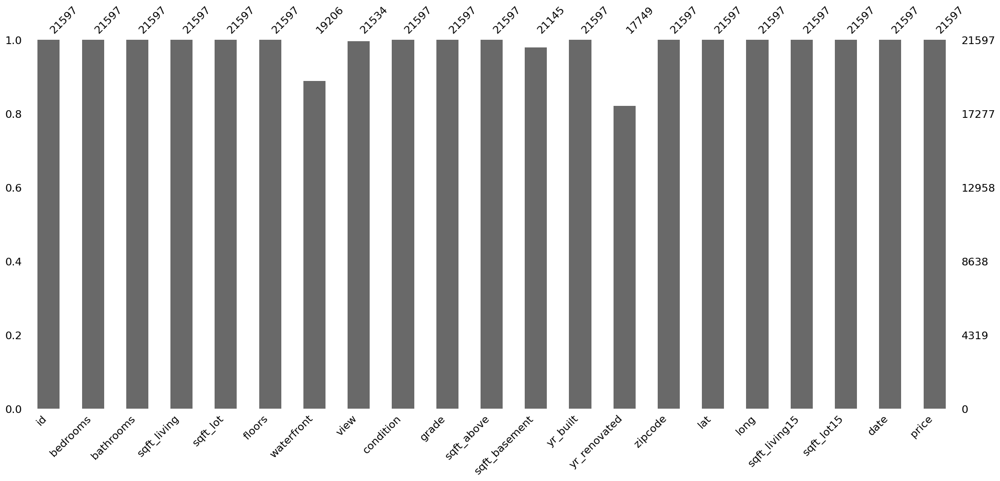

In [6]:
# Check for missing data
import missingno as msno
df_import.isna().sum() 
# yr_renovated & waterfront have a LOT of missing entries, while sqft_basement has 452 (incl. no basement?)
# df_import[df_import['sqft_basement'] == 0].count()

msno.bar(df_import)

#### 'sqft_price' (new column)

In [7]:
# Calculate the price/sqft_living:
df_import['sqft_price'] = df_import['price']/df_import['sqft_living']

In [8]:
# Let's look at the price heatmap again, this time accounting for the sqft-area:
fig_pricemap = px.scatter_mapbox(df_import, lon='long', lat='lat', 
                              hover_name='date',color="sqft_price", 
                              color_continuous_scale=["gold", "deeppink"],
                              # color_continuous_scale=px.colors.sequential.Pinkyl,
                              zoom=8.5,
                              hover_data=["price", "sqft_living", "grade", "condition"])
fig_pricemap.update_layout(title='King County Home Prices',title_x=0.45,
                           autosize=False,
                           minreducedwidth=50,
                           minreducedheight=50,
                           width=1000,
                           height=700,
                           mapbox_style="white-bg",
                           mapbox_layers=[{"below": 'traces', "sourcetype": "raster", "sourceattribution": "United States Geological Survey",
                                          "source": ["https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"]}]
                                          )

fig_pricemap.show() # And now the county looks more expensive (because we accounted for the sqft_living when comparing prices)

In [9]:
fig = px.scatter_geo(df_import[df_import['waterfront'] == 0], lon='long', lat='lat', hover_name='id',color='sqft_price')

# Update layout to focus on King County
fig.update_layout(title='King County Home non-Waterfront Houses',title_x=0.45,
    geo=dict(
        scope='usa',  # Use 'usa' scope for a broader region
        center=dict(lat=47.5, lon=-122.0),  # Center the map on King County
        projection_scale=6,  # Zoom level
        # Define the boundaries
        lataxis=dict(range=[42, 46]),
        lonaxis=dict(range=[-127, -119])
    )
)

fig.show() 

#### 'sqft_basement'

In [10]:
df_import.sqft_basement.median() # 0.00
df_import.sqft_basement.mode() # 0.00
df_import.sqft_basement.mean() # np.float64(291.8572239300071)
px.box(df_import['sqft_basement']) # Welp...

In [11]:
px.scatter(df_import, x='floors', y='sqft_basement') 

# This makes little to no sense
# Also because of all the half-floors counting as categories of their own, making the comparison difficult

In [69]:
px.histogram(df_import, x='floors', y='sqft_basement', nbins=4,
             labels={
                     "sqft_basement": "Area of Basements",
                     "floors": "Nr. of Floors"
                 },
                title="Distribution of Basement Area Across Numbers of Floors")

# The higher the building, the smaller the basement
# Vast majority of buildings are 1-1.5 floors

In [13]:
px.scatter(df_import, x='sqft_basement', y='sqft_above') 

# The straight line is houses where sqft_basement = sqft_above
# So logically, most houses have sqft_above > sqft_basement, rarely vice versa

In [14]:
px.scatter(df_import, x='sqft_living', y='sqft_above') 

# Here we finally see something clear: The straight line of houses with no basement

In [15]:
df_import[df_import['sqft_above'] == df_import['sqft_living']].sqft_basement.unique() # array([ 0., nan])

# Does this mean that the missing data in sqft_basement are all meant to be = 0?

df_import[df_import['sqft_above'] != df_import['sqft_living']].sqft_basement.min() # np.float64(10.0)
df_import[df_import['sqft_above'] != df_import['sqft_living']].sqft_basement.isna().sum() # np.int64(169)
# ===> All but 169 houses, where we really don't know how large the basement is.

# Replace the missing data for basements in houses where sqft_living = sqft_above with 0:
df_import.loc[df_import['sqft_above'] == df_import['sqft_living'], 'sqft_basement'] = 0


#### 'date'

In [16]:

# The column 'date' has the data type "object", so we need to turn the values into proper dates:
type(df_import['date'][0]) # type of 1st observation in 'date' column is str

# from a look at the data frame head we saw that the date format is %Y-%m-%d
df_import['date'] = pd.to_datetime(df_import['date'], format='%Y-%m-%d')
df_import.head(10)
type(df_import['date'][0]) # pandas._libs.tslibs.timestamps.Timestamp


pandas._libs.tslibs.timestamps.Timestamp

#### 'view'

In [17]:
# The column 'view' has mysterious values, including many missings. Let's have a look:
df_import.view.nunique() # 5 unique values
df_import.view.unique() # array([ 0., nan,  3.,  4.,  2.,  1.])
type(df_import['view'][0]) # numpy.float64

# Seems like this column is a 0-4 scale of how in-demand the house's view is
df_import[df_import['view'] == 4].sort_values(by='price', ascending=False).head(7)

# plot against the price:
fig = px.box(df_import, x='view', y='price')
fig.show()
# It does seem to be somewhat correlated to the price!

# But what about the missing values, might they include attractive objects?
# First replace the missing values with 0, and the 0-4 categories to 1-5:
df_import['view'] = df_import.view.replace(4, 5)
df_import['view'] = df_import.view.replace(3, 4)
df_import['view'] = df_import.view.replace(2, 3)
df_import['view'] = df_import.view.replace(1, 2)
df_import['view'] = df_import.view.replace(0, 1)
df_import['view'] = df_import.view.replace(np.nan, 0)
df_import.view.unique()

array([1., 0., 4., 5., 3., 2.])

In [18]:
# plot again against the price: 
# Now the observed rating of the view is on a 1-5 scale, and the missing data is coded 0
fig = px.box(df_import, x='view', y='price')
fig.show() # Now we can see the price distribution of houses with no view rating

#### 'waterfront'

In [19]:
waterfront_houses = df_import[df_import['waterfront'] == 1]

In [20]:
fig = px.scatter_geo(df_import[df_import['waterfront'] == 1], lon='long', lat='lat', hover_name='id',color='sqft_price')

# Update layout to focus on King County
fig.update_layout(title='King County Waterfront Properties',title_x=0.45,
    geo=dict(
        scope='usa',  # Use 'usa' scope for a broader region
        center=dict(lat=47.5, lon=-122.0),  # Center the map on King County
        projection_scale=6,  # Zoom level
        # Define the boundaries
        lataxis=dict(range=[42, 46]),
        lonaxis=dict(range=[-127, -119])
    )
)

fig.show() # As expected, homes with a waterfront tend to be on the higher end of the prices:

In [21]:
# Check for missing data in 'waterfront':
df_import.waterfront.isna().sum() # np.int64(2391)

np.int64(2391)

In [22]:
# Plot houses missing data in column 'waterfront':

waterfront_nan = df_import[df_import.waterfront.isna() == True]
fig = px.scatter_geo(waterfront_nan, lon='long', lat='lat', hover_name='id',color="sqft_price")

# Update layout to focus on King County
fig.update_layout(title='King County Homes (Waterfront info missing)',title_x=0.45,
    geo=dict(
        scope='usa',  # Use 'usa' scope for a broader region
        center=dict(lat=47.5, lon=-122.0),  # Center the map on King County
        projection_scale=6,  # Zoom level
        # Define the boundaries
        lataxis=dict(range=[42, 46]),
        lonaxis=dict(range=[-127, -119])
    )
)

fig.show() 

In [23]:
# Plot houses with missing data in 'waterfront' but a good 'view' grade (>3)

fig = px.scatter_geo(waterfront_nan[waterfront_nan['view'] == 5], lon='long', lat='lat', hover_name='id',color="sqft_price")

# Update layout to focus on King County
fig.update_layout(title='King County Homes (Waterfront info missing, highest view rating)',title_x=0.45,
    geo=dict(
        scope='usa',  # Use 'usa' scope for a broader region
        center=dict(lat=47.5, lon=-122.0),  # Center the map on King County
        projection_scale=6,  # Zoom level
        # Define the boundaries
        lataxis=dict(range=[42, 46]),
        lonaxis=dict(range=[-127, -119])
    )
)

fig.show() 

In [24]:
df_import.sqft_price.describe()

count   21597.000
mean      264.143
std       110.000
min        87.588
25%       182.292
50%       244.645
75%       318.333
max       810.139
Name: sqft_price, dtype: float64

In [25]:
df_import.sqft_price.quantile(.9)

np.float64(406.60664636568254)

<Axes: >

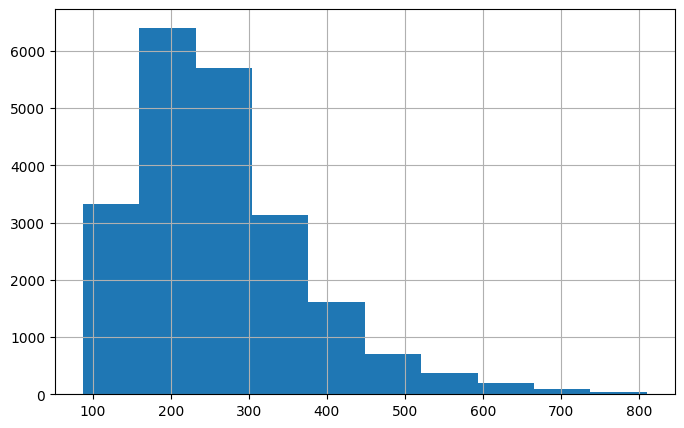

In [26]:
df_import.sqft_price.hist()

---

#### Hypothesis 1:  
It might draw too much attention selling the fancy central objects now.
* sales trend in past months, are this month's sales significantly lower than usual?

Columns useful: date

For starters, try a histogram:

<Axes: >

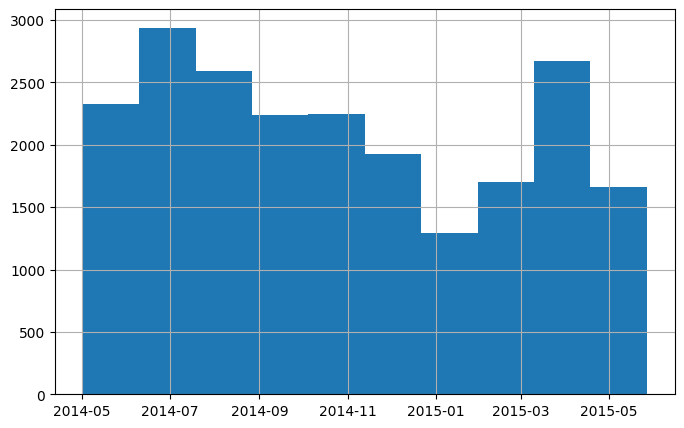

In [27]:
df_import.date.hist()

In [28]:
df_import.date.describe() # We only have sales data for one year (2014-05-02 to 2015-05-27)

count                            21597
mean     2014-10-29 04:20:38.171968512
min                2014-05-02 00:00:00
25%                2014-07-22 00:00:00
50%                2014-10-16 00:00:00
75%                2015-02-17 00:00:00
max                2015-05-27 00:00:00
Name: date, dtype: object

<Axes: >

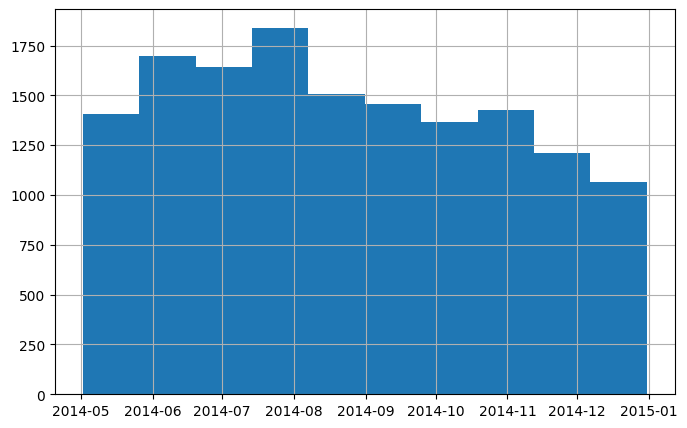

In [29]:
df_import[(df_import['date'] >= '2014-05-02') & (df_import['date'] <= '2014-12-31')].date.hist() # 2014 sales

<Axes: >

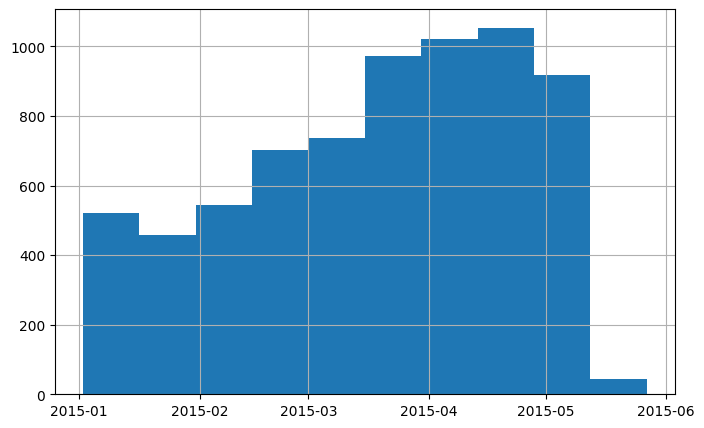

In [30]:
df_import[(df_import['date'] >= '2015-01-01') & (df_import['date'] <= '2015-05-27')].date.hist() # sales for 2015 so far

<Axes: >

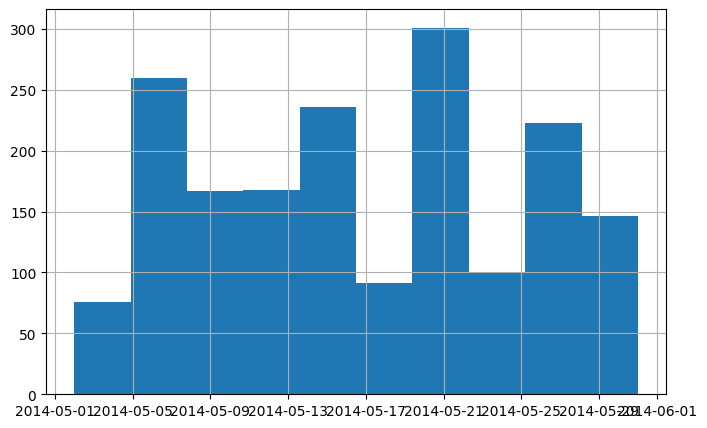

In [31]:
df_import[(df_import['date'] >= '2014-05-01') & (df_import['date'] <= '2014-05-31')].date.hist() # sales for may 2014

<Axes: >

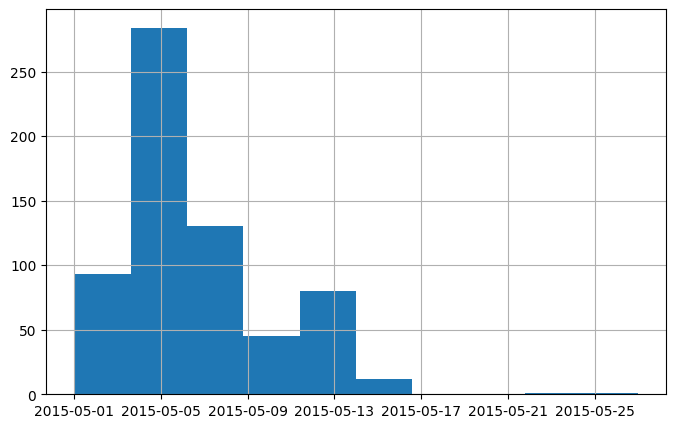

In [32]:
df_import[(df_import['date'] >= '2015-05-01') & (df_import['date'] <= '2015-05-27')].date.hist() # sales for may 2015

In [33]:
# We don't know if this strong dip in sales in the 2nd half of May is a sign of something truly happening
# or just a lack of reported sales at the time of data collection

# To get more insights, let's check the prices over time:

fig = px.line(df_import.groupby('date').mean().reset_index(), x='date', y='sqft_price')
fig.show() # Now the demand doesn't look worrying anymore

In [79]:
df_import['season'] = None
df_import.season[(df_import['date'].dt.month.isin([1, 2, 12]))] = 'winter'
df_import.season[(df_import['date'].dt.month.isin([3, 4, 5]))] = 'spring'
df_import.season[(df_import['date'].dt.month.isin([6, 7, 8]))] = 'summer'
df_import.season[(df_import['date'].dt.month.isin([9, 10, 11]))] = 'fall'
df_import.season.unique()

array(['fall', 'winter', 'spring', 'summer'], dtype=object)

In [99]:
fig = px.line(df_import.groupby(['date', 'season']).median(numeric_only=True).reset_index(), x='date', y='sqft_price',
              labels={
                     "sqft_price": "Price/Sqft.",
                     "date": "Date"
                 },
                 title="Sales Trend in Past Year")
fig.add_vline(x='2015-01-01', line_color='darksalmon')
fig.update_traces(line_color='#456987')
fig.show() # Accounting for outliers by using the median instead of the mean doesn't change the big picture 

According to [current reports]('https://www.claynortham.com/united-states-housing-market-in-2015#:~:text=Nationwide%2C%20residential%20home%20sales%20were,REAL%20Trends%20Housing%20Market%20Report.'), the real estate market is doing better than it did last year in Spring, which is partly due to the harsh climate of last year (2014) compared to this year (2015). This positive trend may, however, be part of a wave that is bound to fluctuate back down. This means that we want to catch the good wave this year, but also not be too slow. 

In [35]:
fig = px.line(df_import[(df_import['date'] >= '2015-05-01') & (df_import['date'] <= '2015-05-27')].groupby(['date', 'season']).median().reset_index(), x='date', y='sqft_price')
fig.show() # price trend in May 2015


In [36]:
fig = px.line(df_import[(df_import['date'] >= '2014-05-01') & (df_import['date'] <= '2014-05-31')].groupby('date').median(numeric_only=True).reset_index(), x='date', y='sqft_price')
fig.show() # price trend in May 2014

In [37]:
fig = px.line(df_import[(df_import['date'] >= '2014-05-01') & (df_import['date'] <= '2014-06-30')].groupby('date').median(numeric_only=True).reset_index(), x='date', y='sqft_price')
fig.show() # price trend in May & June 2014

# Looks like if we start selling at the beginning of June we won't draw too much attention

In [38]:
fig = px.line(df_import[(df_import['date'] >= '2014-05-27') & (df_import['date'] <= '2014-12-31')].groupby('date').median(numeric_only=True).reset_index(), x='date', y='sqft_price')
fig.show() # price trend for May 27 2014 till end of 2014 

# If we use this as an estimate for the sales trend in 2015 after May 27,
# we could say that making sales at the beginning of each month, 
# with the largest sales in Fall (Sep, Oct) as well as before christmas,
# the sales trend for this year would look similar to that of last year

### Recommendation:
Sell properties at the beginning of each month in the remaining months of 2015, with the largest sales being in Sep, Oct

---

#### Hypothesis 2:  
It might draw too much attention selling the fancy central objects in certain seasons (e.g. winter) of the year
* The number of sales is significantly higher for 1 or more specific seasons?

#### Recommendation:
As seen in the last plot, making the big sales in Fall would draw the least attention

In [76]:
fig2 = px.scatter(data_frame=df_import.groupby(['date', 'season']).median(numeric_only=True).reset_index(),
               y='sqft_price', x='date', color='season',
               labels={
                     "sqft_price": "Price/Sqft.",
                     "date": "Date",
                     "season": "Season"
                 },
                title="Sales Trend Across Seasons",
                size="bedrooms", size_max=6)
fig2.show()

In [40]:
fig2 = px.box(df_import, x='season', y='sqft_price')
fig2.show()

#### Recommendation:
Season doesn't seem to matter too much. To avoid attention by authorities, try to randomize the sales over the 4 seasons.

---

#### Hypothesis 3: 
It might draw too much attention selling coastline objects where the client might have used the water as an alternative recycling method for biodegradable "waste"
* overall sales trend of waterfront objects in the past years - the newer the date, the less sales?

<Axes: xlabel='date', ylabel='sqft_price'>

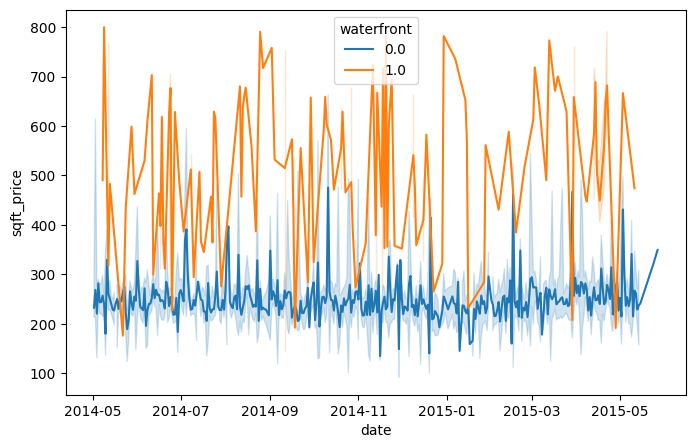

In [58]:
sns.lineplot(x='date', y='sqft_price', data=df_import, hue='waterfront', estimator="median")
# fig.update_layout()

#### Recommendation:
Also here, the sales trend for waterfront homes doesn't seem to show any screaming decline that wouldn't be evened out by the cyclical fluctuations. Therefore, it would be fine for the client to sell waterfront homes.

---

#### Hypothesis 4: 
It might draw attention to sell fancy central houses and NOT sell the average ones in the outskirts
* Sales of average houses in the outskirts are higher than those of top 10% quality houses in city center?

In [64]:
# First, let's find a working definition of "central" vs. "outskirts" and "top 10%" vs. "average" properties

# df_import.groupby('view').date.count() # count of sales grouped by view rating
import geopy as gp
from geopy import distance

df_import['coords'] = df_import[["lat", "long"]].apply(tuple, axis=1)

def dist2center(x, kc_center = (47.548320, -122.229983)):
    return distance.distance(x, kc_center).km

df_import['distance2center'] = df_import['coords'].apply(dist2center)

df_import.head()

fig = px.scatter(df_import, x='distance2center', y='sqft_price', color='grade',
                 labels={
                     "sqft_price": "Price/Sqft.",
                     "distance2center": "Distance from KC Center of Population",
                     "grade": "Grade"
                 },
                title="Property Value & Rating Across Distances from Center")
fig.show() 

# As expected, there are more sales towards the county center, 
# and the sqft_price becomes lower, the further we get from the county center.

# The grade of the houses closest to center is on the higher end
# The isolated houses (distance2center > 60) don't look too fancy, but include "average" quality - perfect!
# We might also need some mid-distance houses (50 > distance2center > 30 ), in case we need a quick hideaway


<Axes: xlabel='distance2center', ylabel='Count'>

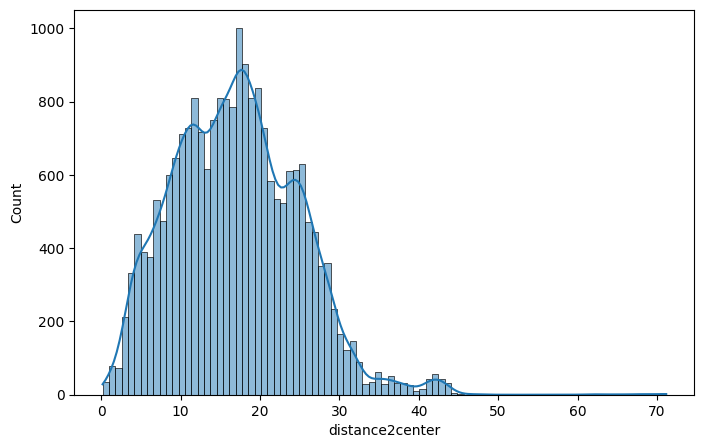

In [43]:
sns.histplot(df_import, x='distance2center', kde=True)

# It would look perfectly normal NOT to sell the most isolated properties, since the sales in the outskirts are particularly rare

<Axes: xlabel='date', ylabel='Count'>

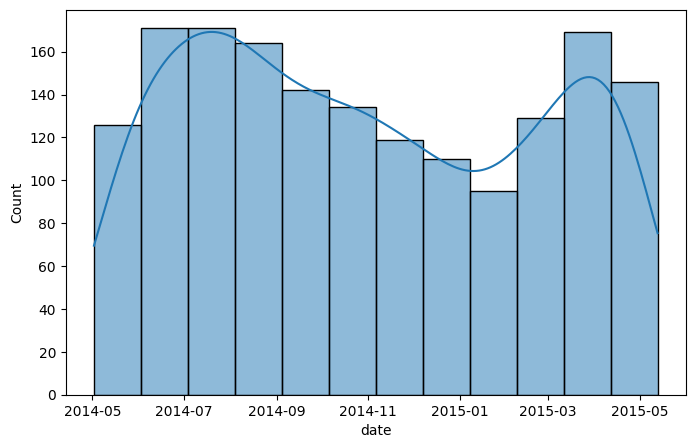

In [44]:
# fig = px.histogram(df_import[df_import['distance2center'] > 28], x='date')
# fig.show() 

sns.histplot(df_import[df_import['distance2center'] > 28], x='date', kde=True)

# Looks like the trend of sales for mid-to-far properties might be cyclically fluctuating
# so that it wouldn't be surprising to sell such properties in July & August
# But they also don't seem like they're having a total boom at the time of data collection

<Axes: xlabel='date', ylabel='Count'>

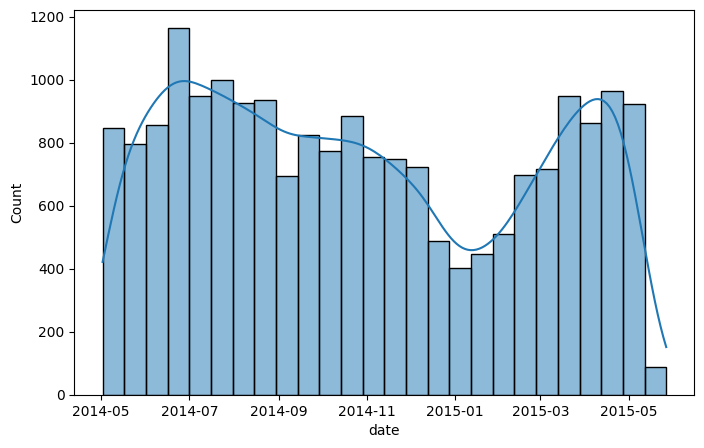

In [45]:
sns.histplot(df_import[df_import['distance2center'] <= 28], x='date', kde=True)

# Here we see that the overall (nr. of) sales trend follows the same wave in both central and distant properties
# Once again, we see the drastic dip in sales in May 2015 as opposed to May 2014 (and any month, really)
# Which should work as a reminder to wait till the summer before selling the fancy properties,
# to make sure we're not missing a significant downward trend which might blow our cover at sale

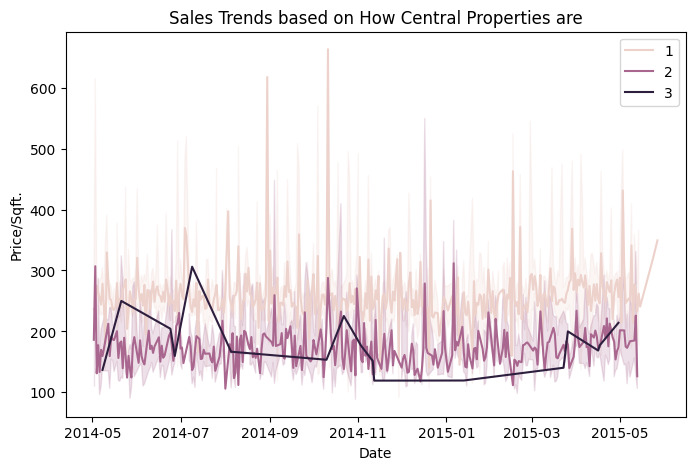

In [104]:
# Let's create a variable that selects 2 categories: central, mid-distance, and isolated
df_import['central'] = 2
df_import.central[df_import['distance2center'] < 28] = 1
df_import.central[df_import['distance2center'] >= 50] = 3

sns.lineplot(x='date', y='sqft_price', data=df_import, hue='central', estimator="median")
plt.title('Sales Trends based on How Central Properties are')
# Set x-axis label
plt.xlabel('Date')
# Set y-axis label
plt.ylabel('Price/Sqft.')
# TOP 10% CENTRAL PROPERTIES (WATERFRONT VS. NO WATERFRONT)
plt.legend(loc='upper right')

# From this plot, if we only care about how central the property is, it looks the least flashy
# if you sell the central properties towards Fall of 2015 (especially Sep, Oct)

Text(0, 0.5, 'Price/Sqft.')

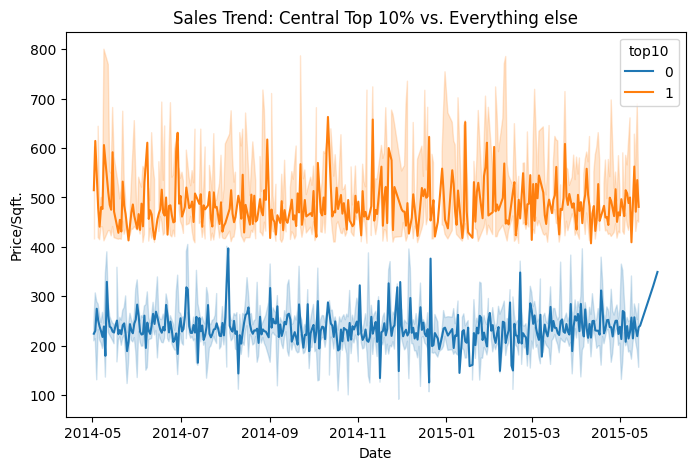

In [105]:
# Now we need to find a working definition of "top 10%"
# One way to define it could be using sqft_price, which would maximize profit
# So let's select properties with sqft_price >= 90%-quantile, which are CENTRAL:

df_import['top10'] = 0
df_import.top10.loc[(df_import['sqft_price'] >= df_import['sqft_price'].quantile(0.9)) & (df_import['central'] == 1)] = 1
df_import.top10.unique()

sns.lineplot(df_import, x='date', y='sqft_price', hue='top10', estimator='median')
plt.title('Sales Trend: Central Top 10% vs. Everything else')
# Set x-axis label
plt.xlabel('Date')
# Set y-axis label
plt.ylabel('Price/Sqft.')

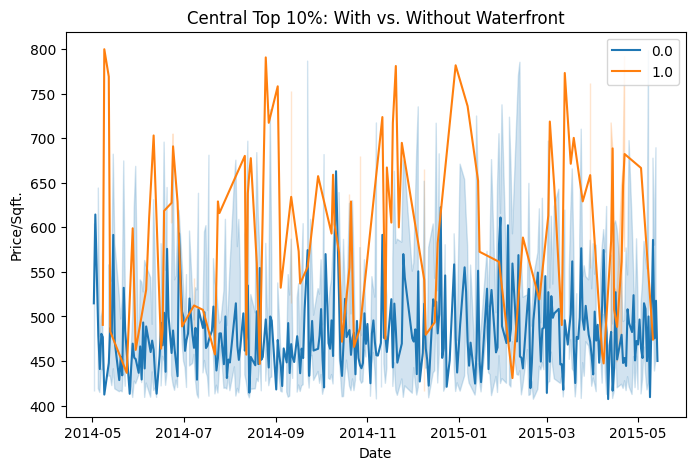

In [61]:
top10central = df_import[df_import['top10'] == 1]
sns.lineplot(top10central, x='date', y='sqft_price', hue='waterfront', estimator='median')

plt.title('Central Top 10%: With vs. Without Waterfront')
# Set x-axis label
plt.xlabel('Date')
# Set y-axis label
plt.ylabel('Price/Sqft.')
# TOP 10% CENTRAL PROPERTIES (WATERFRONT VS. NO WATERFRONT)
plt.legend(loc='upper right')

In [49]:
fig_top10map = px.scatter_mapbox(top10central, lon='long', lat='lat', 
                              hover_name='date',color="sqft_price", 
                              color_continuous_scale=["darkorange", "deeppink"],
                              # color_continuous_scale=px.colors.sequential.Pinkyl,
                              zoom=8.5,
                              hover_data=["price", "sqft_living", "grade", "condition"])
fig_top10map.update_layout(title='Central Top 10% Properties Prices',title_x=0.45,
                           autosize=False,
                           minreducedwidth=50,
                           minreducedheight=50,
                           width=1000,
                           height=700,
                           mapbox_style="white-bg",
                           mapbox_layers=[{"below": 'traces', "sourcetype": "raster", "sourceattribution": "United States Geological Survey",
                                          "source": ["https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"]}]
                                          )

fig_top10map.show()

#### Recommendation:
* It's perfectly fine NOT to sell the distant properties, as the sales of these are particularly low overall
* It's also fine to sell the central 'top10' properties right away
* It might be better to wait until Sept & Oct, since these might sell at higher prices then

### Bonus:
#### Best safe houses on the market:

* For our client's purposes, it's good to have several different safe houses
* It's good to have options for quick escape (medium distance from the center)
* It's also good to have options that are extremely isolated, for "bidness protection programs"

#### The Quick Escape:

* We want properties that are within reasonable reach from the county center
* The property also needs to be of "average" qualities, to avoid curious FBI agents

In [50]:

# First, let's find a working definition for 'average' properties

#--------------------------------------------------------------------------------------------------------------#

# One way to see it is by looking at the sqft_price, but as buyers, we don't want to spend too much, 
# so it's enough to avoid high-end objects (to be safe, the 0.75 quantile)
quick_escape = df_import[df_import['sqft_price'] < df_import['sqft_price'].quantile(.75)]

# quick_escape.info() # Narrowed down to 16197 properties

#--------------------------------------------------------------------------------------------------------------#

# We want this one to be in the mid-distance:
quick_escape = df_import[df_import['central'] == 2]

# quick_escape.info() # Narrowed down to 1658 properties

#--------------------------------------------------------------------------------------------------------------#

# Another way to see it is by looking at the actual quality of the property, such as grade, condition
# We also need a certain minimum of quality, since we need to feel comfy while hiding, hence no less than the .4 quantile:

# 'grade' 
quick_escape = quick_escape[quick_escape['grade'] > quick_escape['grade'].quantile(.4)]
quick_escape = quick_escape[quick_escape['grade'] < quick_escape['grade'].quantile(.75)]
# quick_escape.info() # Narrowed down to 483 properties

# 'condition'
# quick_escape = quick_escape[quick_escape['condition'] > quick_escape['condition'].quantile(.2)]
quick_escape = quick_escape[quick_escape['condition'] < quick_escape['condition'].quantile(.75)]
# quick_escape.info() # Narrowed down to 1 property - Eureka!

#--------------------------------------------------------------------------------------------------------------#

# The number of floors might be of interest, since we might need to have overview of surroundings when on-the-run
# quick_escape = quick_escape[quick_escape['floors'] > quick_escape['floors'].median()]
# quick_escape.info() # 0 properties available, you can't have it all!

#--------------------------------------------------------------------------------------------------------------#

# And we don't want to buy extremely small or large properties (remember, we hate attention):
# quick_escape = quick_escape[quick_escape['sqft_living'] > quick_escape['sqft_living'].quantile(.25)]
# quick_escape = quick_escape[quick_escape['sqft_living'] > quick_escape['sqft_living'].quantile(.75)]
# quick_escape.info() # 0 properties available, you can't have it all!

#--------------------------------------------------------------------------------------------------------------#

# For our quick escape spot, we might need a waterfront for temporary 'recycling' purposes:
# quick_escape = quick_escape[quick_escape['waterfront'] == 1]
# quick_escape.info() # 0 properties available, you can't have it all!

#--------------------------------------------------------------------------------------------------------------#

# Alternatively, the 'view' might imply some nature nearby, which could replace the waterfront:
# quick_escape = quick_escape[quick_escape['view'] > 1]
# quick_escape.info() # 0 properties available, you can't have it all!


In [51]:
quick_escape.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_living15,sqft_lot15,date,price,sqft_price,season,coords,distance2center,central,top10
17354,9542801410,4.000,1.750,2190.000,8400.000,2.000,0.000,1.000,2,8,...,2410.000,7700.000,2015-01-14,286000.000,130.594,winter,"(47.3003, -122.373)",29.611,2,0


In [101]:
# Let's have a look:
fig_quickescape = px.scatter_mapbox(quick_escape, lon='long', lat='lat', 
                              hover_name='date',color="sqft_price", 
                              color_continuous_scale=["gold", "deeppink"],
                              zoom=8.5,
                              hover_data=["price", "sqft_living", "grade", "condition"])
fig_quickescape.update_layout(title='Our Top Pick for a Quick Weekend Getaway',title_x=0.45,
                           autosize=False,
                           minreducedwidth=50,
                           minreducedheight=50,
                           width=1000,
                           height=700,
                           mapbox_style="white-bg",
                           mapbox_layers=[{"below": 'traces', "sourcetype": "raster", "sourceattribution": "United States Geological Survey",
                                          "source": ["https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"]}]
                                          )

fig_quickescape.show()

#### The 'Bidness Protection Program':

* We want properties that are far and away, where nobody would want to come looking
* The property also needs to be of "average" qualities, to avoid curious FBI agents

In [53]:

# First, let's find a working definition for 'average' properties

#--------------------------------------------------------------------------------------------------------------#

# One way to see it is by looking at the sqft_price, but as buyers, we don't want to spend too much, 
# so it's enough to avoid high-end objects (to be safe, the 0.75 quantile)
bpp = df_import[df_import['sqft_price'] < df_import['sqft_price'].quantile(.75)]

# bpp.info() # Narrowed down to 16197 properties

#--------------------------------------------------------------------------------------------------------------#

# We want this one to be in the mid-distance:
bpp = bpp[bpp['central'] == 3]

# bpp.info() # Narrowed down to 18 properties

#--------------------------------------------------------------------------------------------------------------#

# Another way to see it is by looking at the actual quality of the property, such as grade, condition
# We also need a certain minimum of quality, since we need to feel comfy while hiding, hence no less than the .4 quantile:

# 'grade' 
bpp = bpp[bpp['grade'] > bpp['grade'].quantile(.4)]
bpp = bpp[bpp['grade'] < bpp['grade'].quantile(.75)]
# bpp.info() # Narrowed down to 7 properties

# 'condition'
bpp = bpp[bpp['condition'] > bpp['condition'].quantile(.2)]
# bpp = bpp[bpp['condition'] < bpp['condition'].quantile(.99)]
# bpp.info() # Narrowed down to 2 properties - The condition is 4 but the grade is 7 (as 'mid' as it gets)


In [54]:
bpp.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_living15,sqft_lot15,date,price,sqft_price,season,coords,distance2center,central,top10
3292,9413400165,3.000,2.250,1860.000,15559.000,2.000,0.000,1.000,4,7,...,1110.000,11586.000,2014-06-24,380000.000,204.301,summer,"(47.1559, -121.646)",62.050,3,0
13236,8649400410,3.000,1.750,2140.000,13598.000,1.500,0.000,1.000,4,7,...,930.000,10150.000,2015-04-17,375000.000,175.234,spring,"(47.7139, -121.321)",70.752,3,0


In [55]:
bpp['sqft_basement']

3292      0.000
13236   520.000
Name: sqft_basement, dtype: float64

In [102]:
# Let's have a look:
fig_bpp = px.scatter_mapbox(bpp, lon='long', lat='lat', 
                              hover_name='date',color="sqft_price", 
                              color_continuous_scale=["gold", "deeppink"],
                              zoom=8.5,
                              hover_data=["price", "sqft_living", "grade", "condition"])
fig_bpp.update_layout(title='Our Top Picks for a Quiet Me-Time',title_x=0.45,
                           autosize=False,
                           minreducedwidth=50,
                           minreducedheight=50,
                           width=1000,
                           height=700,
                           mapbox_style="white-bg",
                           mapbox_layers=[{"below": 'traces', "sourcetype": "raster", "sourceattribution": "United States Geological Survey",
                                          "source": ["https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"]}]
                                          )

fig_bpp.show()

Since the cheaper property (blue) was only bought last month, it's better not to draw attention by asking the owners to sell again, unless of course it's already listed. The huge advantage is that it has a basement, so we might wanna get to know the owners well and then see if they're willing to sell on the hush-hush.

---

!['Rock from Everything, Everywhere, All At Once'](https://media4.giphy.com/media/v1.Y2lkPTc5MGI3NjExaHVsM3FzNzhsYjR5Z290MGNxc3E0eWV0djJiYTIxaGZzcnhvd3JheSZlcD12MV9pbnRlcm5hbF9naWZfYnlfaWQmY3Q9Zw/TejmLnMKgnmPInMQjV/giphy.webp)

_May the rocks of your home 
stay blissfully unturned,
the waters of your conscience
calm and clear._ 
— Anonymous, ca. 3:00 AM